In [67]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score
import plotly.graph_objs as go
import plotly.io as pio
pio.templates.default = "plotly_dark"
from plotly.subplots import make_subplots
import dash
from dash import dcc
from dash import html
from plotly import graph_objs as go
from jupyter_dash import JupyterDash
from dash import dash_table
import dash_core_components as dcc
import dash_bootstrap_components as dbc
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 1000)

In [68]:
df_example = pd.read_csv(r"C:\Users\rocks\OneDrive\Masaüstü\Online Shop Customer Sales Data.csv")

# Verinin saf, ilk hali

In [69]:
df_example.head()

,Customer_id,Age,Gender,Revenue_Total,N_Purchases,Purchase_DATE,Purchase_VALUE,Pay_Method,Time_Spent,Browser,Newsletter,Voucher
0,504308,53,0,45.3,2,22.06.21,24.915,1,885,0,0,0
1,504309,18,1,36.2,3,10.12.21,2.896,2,656,0,0,1
2,504310,52,1,10.6,1,14.03.21,10.600,0,761,0,1,0
3,504311,29,0,54.1,5,25.10.21,43.280,1,906,0,1,0
4,504312,21,1,56.9,1,14.09.21,56.900,1,605,0,1,0


# FONKSİYONAL VERİ TEMİZLEME, VERİ GÖRSELLEŞTİRME

In [70]:
class DataPreprocessing:
    @staticmethod

    # Tüm veri temizleme, veriyi analize hazır hale getirildiği alan. Bu alan isteğe göre daha da optimize edilebilir veya yeni özellikler eklenebilir.
    def data_preprocessing(path = None):
        df = pd.read_csv(path)
    
        df["DAYS"] = pd.to_datetime(df["Purchase_DATE"], format = "%d.%m.%y").dt.day
        df["MONTHS"] = pd.to_datetime(df["Purchase_DATE"], format = "%d.%m.%y").dt.month
        df["YEARS"] = pd.to_datetime(df["Purchase_DATE"], format = "%d.%m.%y").dt.year

        labels1 = ["LOW", "MEDIUM", "HIGH", "PREMIUM"]
        bins1 = [0, df['Revenue_Total'].quantile(0.25), df['Revenue_Total'].quantile(0.66), df['Revenue_Total'].quantile(0.90), df["Revenue_Total"].max()]
        df["REVENUE_SEGMENT"] = pd.cut(df["Revenue_Total"], bins = bins1, labels = labels1).astype("category")

        labels2 = ["0-18", "18-30", "30-45", "45-60", "60++"]
        bins2 = [0, 18, 30, 45, 60, 100]
        df["AGE_CAT"] = pd.cut(df["Age"], labels = labels2, bins = bins2).astype("category")

        df["TIME_MIN"] = (df["Time_Spent"] / 60).astype("int64")

        labels3 = ["Quarter1", "Quarter2", "Quarter3", "Quarter4"]
        bins3 = [0, 8, 15, 22, 31]
        df["WEEK_QUARTER"] = pd.cut(df["DAYS"], labels = labels3, bins = bins3).astype("category")

        bins4 = [0, 3, 6, 9, 12]
        df["MONTHS_QUARTER"] = pd.cut(df["MONTHS"], labels = labels3, bins = bins4).astype("category")

        df["MONTHS"] = df["MONTHS"].replace({1: "JANUARY", 
                                      2: "FEBRUARY", 
                                      3: "MARCH", 
                                      4: "APRIL", 
                                      5: "MAY", 
                                      6: "JUNE", 
                                      7: "JULY", 
                                      8: "AUGUST", 
                                      9: "SEPTEMBER", 
                                      10: "OCTOBER", 
                                      11: "NOVEMBER", 
                                      12: "DECEMBER"})
        
        cat_categories = ["JANUARY", "FEBRUARY", "MARCH", "APRIL", "MAY", "JUNE", "JULY", "AUGUST", "SEPTEMBER", "OCTOBER", "NOVEMBER", "DECEMBER"]

        from pandas.api.types import CategoricalDtype
        
        df["MONTHS"] = df["MONTHS"].astype(CategoricalDtype(categories=cat_categories, ordered=True))

        for col in df.select_dtypes(include=["category", "object"]):
            if str(df[col].dtypes) in "category":
                df[col] = df[col].str.upper()
        else:
            df[col] = df[col].fillna("EMPTY VALUES!").str.upper()   

        df.columns = [col.upper() for col in df.columns]

        return df
    
##############################################################################################################################################################################

# Tüm Grafik Kütüphanelerimizin yazıldığı sınıf. İsteğe göre daha da özelleştirilebilir. İsteğe göre daha farklı Plotly Grafikleri veya Seaborn grafikleri eklenebilir.

class Graphs:
        def Countplot_X(df = None, cat_cols = None, caption = None, hue = None):
            import matplotlib.pyplot as plt
            ordered_values = df[cat_cols].value_counts().sort_values(ascending=False).index.to_list()
            plt.figure(figsize=(15,8))
            ax = sns.countplot(data = df, x = df[cat_cols], order = ordered_values, palette = "pastel", hue = hue, linewidth = 5.0)
            ax.set_facecolor('black')
            ax.xaxis.label.set_color('black')
            ax.yaxis.label.set_color('black')
            ax.title.set_color('black')
            ax.tick_params(axis='x', colors='black')
            ax.tick_params(axis='y', colors='black')
            ax.xaxis.set_tick_params(color='black')
            ax.yaxis.set_tick_params(color='black')
            ax.grid(color='white')
            for container in ax.containers:
                ax.bar_label(container, color='white')
            plt.tight_layout()
            plt.xticks(rotation = 45)
            plt.grid(True)
            plt.title(caption)
            return ax

##############################################################################################################################################################################

        def Countplot_Y(df = None, cat_cols = None, caption = None, hue = None):
            ordered_values = df[cat_cols].value_counts().sort_values(ascending=False).index.to_list()
            plt.figure(figsize=(15,8))
            ax = sns.countplot(data = df, y = df[cat_cols], order = ordered_values, palette = "pastel", hue = hue, linewidth = 5.0)
            ax.set_facecolor('black')
            ax.xaxis.label.set_color('black')
            ax.yaxis.label.set_color('black')
            ax.title.set_color('black')
            ax.tick_params(axis='x', colors='black')
            ax.tick_params(axis='y', colors='black')
            ax.xaxis.set_tick_params(color='black')
            ax.yaxis.set_tick_params(color='black')
            ax.grid(color='white')
            for container in ax.containers:
               ax.bar_label(container, color='white')
            plt.tight_layout()
            plt.xticks(rotation = 45)
            plt.title(caption)
            return ax

##############################################################################################################################################################################

        def Bar_Plot_All_DF(df, caption=None):
            import plotly.graph_objs as go
            for col in df.select_dtypes(include=(["object", "category", "int64"])):
                if df[col].nunique() < 50:
                     freq = df[col].value_counts().sort_values(ascending=False)
                     trace = go.Bar(
                         x=freq.index,
                         y=freq.values,
                         text=freq.values,
                         textposition="inside",
                         marker=dict(color=freq.values, colorscale="Viridis"),
                         hovertemplate="Category: %{x}<br>Count: %{y}<extra></extra>",
                         )
                     layout = go.Layout(
                         title=f"{caption}: {col}",
                         title_x=0.5,
                         xaxis=dict(title=col, tickangle=-45),
                         yaxis=dict(title="Counts"),
                         width=1300,
                         height=800,
                         showlegend=False,
                         margin=dict(l=100, r=100, t=100, b=100),
                         plot_bgcolor="white",
                         hovermode="closest",
                          )
                fig.update_layout(
                title={
                'y': 0.95,
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': {'size': 24}})
                fig = go.Figure(data=[trace], layout=layout)
                return fig

##############################################################################################################################################################################
        
        def Pie_Plot(df, caption = None, num_col = None, cat_col = None):
            import plotly.express as px
            fig = px.pie(df, values = num_col, names = cat_col,
            title = caption,
            height = 800, width = 1300,
            color_discrete_sequence=px.colors.qualitative.Pastel)

            fig.update_traces(textinfo='label+percent', insidetextorientation='radial', showlegend=True)
            fig.update_traces(hovertemplate="<b>%{label}</b><br>Toplam: %{value}<br>Yüzde: %{percent:.2%}",
                                textposition='outside',
                                textfont=dict(size=14))
            fig.update_layout(title=dict(text= caption),
            legend=dict(title=dict(text="<b>Tanılar</b>", font=dict(size=18)),
                                   font=dict(size=14),
                                   orientation="v",
                                   yanchor="top",
                                   y=0.99,
                                   xanchor="left",
                                   x=1.01)
            )
            fig.update_layout(plot_bgcolor='rgba(240, 240, 240, 0)',  
            paper_bgcolor='rgba(240, 240, 240, 0)',
            xaxis_title_font={'size': 18, 'color': 'white'},
            yaxis_title_font={'size': 18, 'color': 'white'}),
            fig.update_xaxes(tickfont=dict(color='white', size=14),)
            fig.update_yaxes(tickfont=dict(color='white', size=14))
            fig.update_layout(
                title={
                'y': 0.95,
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': {'size': 24}})
            return fig

##############################################################################################################################################################################

        def Hist_Plot(df = None, num_col = None, caption = None, color = None ):
            fig = px.histogram(df,
                       x= num_col, 
                       nbins=20,
                       height=800, 
                       width=1300, 
                       title=caption,
                       color_discrete_sequence=px.colors.qualitative.Dark2,
                       marginal="rug", 
                       text_auto=True,
                       color = color)
            fig.update_traces(hovertemplate='<br>Toplam: %{y}<br> Bins: %{x}')
            fig.update_traces(marker=dict(line=dict(width=1.5, color='DarkSlateGrey')))
            fig.update_xaxes(title_text=str.upper(num_col))
            fig.update_yaxes(title_text="TOPLAM")
            fig.update_layout(plot_bgcolor='rgba(240, 240, 240, 0)', 
            paper_bgcolor='rgba(240, 240, 240, 0)',
            xaxis_title_font={'size': 18, 'color': 'white'},
            yaxis_title_font={'size': 18, 'color': 'white'}),
            fig.update_xaxes(tickfont=dict(color='white', size=14),)
            fig.update_yaxes(tickfont=dict(color='white', size=14))
            fig.update_layout(
                title={
                'y': 0.95,
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': {'size': 24}})
            return fig
##############################################################################################################################################################################

        def Funnel_Plot(df, cat_col = None, num_col = None, caption = None):
            from plotly import graph_objects as go
            df_grouped = df.groupby(cat_col).agg({num_col : "sum"}).reset_index()
            df_grouped = df_grouped.sort_values(by = num_col, ascending = False)
            fig = px.funnel(df_grouped,
                            x = num_col,
                            y = cat_col,
                            height = 800,
                            width = 1400)
            
            fig.update_traces(marker=dict(color=['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']))
            fig.update_layout(title_text= caption)
            fig.update_layout(plot_bgcolor='rgba(240, 240, 240, 0)', 
            paper_bgcolor='rgba(240, 240, 240, 0)',
            xaxis_title_font={'size': 18, 'color': 'white'},
            yaxis_title_font={'size': 18, 'color': 'white'}),
            fig.update_xaxes(tickfont=dict(color='white', size=14),)
            fig.update_yaxes(tickfont=dict(color='white', size=14))
            fig.update_xaxes(title_text= cat_col, title_font=dict(size=18))
            fig.update_yaxes(title_text= num_col, title_font=dict(size=18))
            fig.update_layout(
                title={
                'y': 0.95,
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': {'size': 24}})
            return fig

##############################################################################################################################################################################
        
        def Time_Series(df, date_col=None, num_col=None):
            df2 = df.sort_values(by=date_col, ascending=True)
            df2[date_col] = df2[date_col].astype("datetime64[ns]")
            df_grouped = df2.groupby(date_col).agg({num_col: "sum"}).reset_index()

            fig = px.area(df_grouped,
                          x=date_col,
                          y=num_col,
                          height=800,
                          width=1500)

            fig.update_layout(title=f'Time Series Chart: {num_col}')
            fig.update_layout(plot_bgcolor='rgba(240, 240, 240, 0)', 
            paper_bgcolor='rgba(240, 240, 240, 0)',
            xaxis_title_font={'size': 18, 'color': 'white'},
            yaxis_title_font={'size': 18, 'color': 'white'}),
            fig.update_xaxes(tickfont=dict(color='white', size=14),)
            fig.update_yaxes(tickfont=dict(color='white', size=14))
            fig.update_xaxes(title_text='Value', showgrid=True, gridwidth=1, gridcolor='lightgray', type='date', tickformat='%Y-%m-%d')
            fig.update_yaxes(title_text=f'{num_col} Total Value', showgrid=True, gridwidth=1, gridcolor='lightgray')
            fig.update_traces(line=dict(color='blue', width=2, dash='solid'), hovertemplate='%{x}<br>%{y}')
            fig.add_scatter(x=df_grouped[date_col], y=df_grouped[num_col], mode='markers', marker=dict(color='red', size=8, symbol='circle'))
            fig.update_layout(
                title={
                'y': 0.95,
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': {'size': 24}})
            return fig

##############################################################################################################################################################################

        def Bar_Plot(df = None, cat_col = None, num_col = None, color_col = None, caption = None):
            grouped_df = df.groupby(cat_col).agg({num_col : "sum"}).reset_index().sort_values(by = num_col, ascending = False)
            fig = px.bar(grouped_df,
                         x = cat_col,
                         y = num_col,
                         color = color_col,
                         text = num_col,
                         height = 800,
                         width = 1400,
                         title = caption
                         )
            
            fig.update_layout(plot_bgcolor='rgba(240, 240, 240, 0)',  # Grafiğin arka plan rengi
            paper_bgcolor='rgba(240, 240, 240, 0)',
            xaxis_title_font={'size': 18, 'color': 'white'},
            yaxis_title_font={'size': 18, 'color': 'white'}),
            fig.update_xaxes(tickfont=dict(color='white', size=14),)
            fig.update_yaxes(tickfont=dict(color='white', size=14))
    
            fig.update_traces(texttemplate='%{text:.2s}', textposition='outside',
                   textfont=dict(size=14, color='white', family='Arial, sans-serif'),
                   marker=dict(line=dict(color='rgba(0, 0, 0, 0.1)', width=0.5))
                   )
            fig.update_traces(marker={'line': {'color': '#000000', 'width': 2}})
            fig.update_layout(
                title={
                'y': 0.95,
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': {'size': 24}})
            return fig

##############################################################################################################################################################################
        
        def Facet_Bar_Plot(df = None, cat_col = None, num_col = None, color_col = None, facet_col = None, caption = None):
            grouped_df = df.groupby([cat_col, color_col, facet_col]).agg({num_col: "sum"}).reset_index().sort_values(by=num_col, ascending=False)
            unique_values = grouped_df[facet_col].unique()
            fig = make_subplots(rows=1, cols=len(unique_values), subplot_titles=[f"{facet_col}: {val}" for val in unique_values])

            for index, value in enumerate(unique_values):
                filtered_df = grouped_df[grouped_df[facet_col] == value]
        
                fig.add_trace(go.Bar(x=filtered_df[cat_col],
                             y=filtered_df[num_col],
                             text=filtered_df[color_col],
                             name=f"{facet_col}: {value}",
                             hovertemplate=f"%{{x}}<br>{num_col}: %{{y}}<br>{color_col}: %{{text}}",
                             marker=dict(line=dict(color='black', width=2))
                             ),
                            row=1, col=index + 1)

            fig.update_layout(title=f"{caption}",
                  xaxis_title=cat_col,
                  yaxis_title=f"{num_col}",
                  width=1500,
                  height=800)
            fig.update_xaxes(tickfont=dict(color='white', size=14),)
            fig.update_yaxes(tickfont=dict(color='white', size=14))
            fig.update_traces(texttemplate='%{text:.2s}', textposition='outside',
                      textfont=dict(size=14, color='black', family='Arial, sans-serif'))
            fig.update_layout(plot_bgcolor='rgba(240, 240, 240, 0)',  # Grafiğin arka plan rengi
            paper_bgcolor='rgba(240, 240, 240, 0)',
            xaxis_title_font={'size': 18, 'color': 'white'},
            yaxis_title_font={'size': 18, 'color': 'white'}),
            fig.update_layout(
                title={
                'y': 0.95,
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': {'size': 24}})
            return fig
        
##############################################################################################################################################################################
        
        def Scatter_Plot(df = None, cat_col = None, num_col = None, caption = None):
             fig = go.Figure()
             df_grouped = df.groupby(cat_col).agg({num_col : "sum"}).reset_index()
             fig.add_trace(go.Scatter(x=df_grouped[cat_col], y=df_grouped[num_col],
                           mode='lines+markers', name='İşlem Ücreti',
                           line={"width": 2, "color": 'rgb(131, 90, 241)'},
                           marker={"size": 8, "color": "rgb(131, 90, 241)", "symbol": "circle"},
                           hovertemplate="%{x}<br>İşlem Ücreti: %{y}"))

             fig.update_layout(
                   title_text= caption,
                   title_font={'size': 24, 'color': 'navy'},
                   xaxis_title=cat_col,
                   xaxis_title_font={'size': 18, 'color': 'navy'},
                   yaxis_title=num_col,
                   yaxis_title_font={'size': 18, 'color': 'navy'},
                   plot_bgcolor='rgba(0, 0, 0, 0)',
                   xaxis_showgrid=True,
                   yaxis_showgrid=True,
                   yaxis_gridcolor='rgba(128, 128, 128, 0.2)',
                   xaxis_gridcolor='rgba(128, 128, 128, 0.2)',
                   hovermode="x",
                   height=800,
                   width=1500
                   )
             fig.update_layout(plot_bgcolor='rgba(240, 240, 240, 0)', 
             paper_bgcolor='rgba(240, 240, 240, 0)',
             xaxis_title_font={'size': 18, 'color': 'white'},
             yaxis_title_font={'size': 18, 'color': 'white'}),
             fig.update_xaxes(tickfont=dict(color='white', size=14),)
             fig.update_yaxes(tickfont=dict(color='white', size=14)) 
             fig.update_traces(marker=dict(size=10, line=dict(width=2, color='black')))
             fig.update_layout(
                title={
                'y': 0.95,
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': {'size': 24, "color" : "white"}})
             return fig

##############################################################################################################################################################################
        
        def Create_Indicator_Plot(df, num_col, cat_col):
            indicator1 = go.Indicator(mode="gauge+number", 
                                       value=sum(df[num_col]), 
                                       domain={"x": [0, 0.5], "y": [0, 1]}, 
                                       title={"text": f"Sum of {num_col}", 
                                              "font": {"size": 14}},
            ) 
            indicator2 = go.Indicator(
                         mode="gauge+number",
                         value=len(df[cat_col]),
                         domain={"x": [0.5, 1], "y": [0, 1]},
                         title={"text": f"Count of {cat_col}",
                         "font": {"size": 14}}, 
            )

            fig = make_subplots(rows=1, cols=2, specs=[[{"type": "indicator"}, {"type": "indicator"}]])
            fig.add_trace(indicator1, row=1, col=1)
            fig.add_trace(indicator2, row=1, col=2)
            fig.update_layout(height=400, width=1500)
            fig.update_layout(plot_bgcolor='rgba(240, 240, 240, 0)', 
            paper_bgcolor='rgba(240, 240, 240, 0)',
            xaxis_title_font={'size': 18, 'color': 'white'},
            yaxis_title_font={'size': 18, 'color': 'white'}),
            fig.update_xaxes(tickfont=dict(color='white', size=14),)
            fig.update_yaxes(tickfont=dict(color='white', size=14))
            fig.update_layout(
                title={
                'y': 0.95,
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': {'size': 24}})
            return fig
        
##############################################################################################################################################################################

        def Create_Indicator_Plot_Without_Agg(val1, val2, text1, text2):
            indicator1 = go.Indicator(mode="gauge+number", 
                                       value= (val1), 
                                       domain={"x": [0, 0.5], "y": [0, 1]}, 
                                       title={"text": text1, 
                                              "font": {"size": 14}},
            ) 
            indicator2 = go.Indicator(
                         mode="gauge+number",
                         value= (val2),
                         domain={"x": [0.5, 1], "y": [0, 1]},
                         title={"text": text2,
                         "font": {"size": 14}}, 
            )

            fig = make_subplots(rows=1, cols=2, specs=[[{"type": "indicator"}, {"type": "indicator"}]])
            fig.add_trace(indicator1, row=1, col=1)
            fig.add_trace(indicator2, row=1, col=2)
            fig.update_layout(height=400, width=1500)
            fig.update_layout(plot_bgcolor='rgba(240, 240, 240, 0)', 
            paper_bgcolor='rgba(240, 240, 240, 0)',
            xaxis_title_font={'size': 18, 'color': 'white'},
            yaxis_title_font={'size': 18, 'color': 'white'}),
            fig.update_xaxes(tickfont=dict(color='white', size=14),)
            fig.update_yaxes(tickfont=dict(color='white', size=14))
            fig.update_layout(
                title={
                'y': 0.95,
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': {'size': 24}})
            return fig
        
##############################################################################################################################################################################

        def Create_Scatter_3d(df=None, x_col=None, y_col=None, z_col=None, caption=None):
                grouped_df = df.groupby([x_col]).agg({y_col: "mean", z_col: "mean"}).reset_index()
                fig = px.scatter_3d(grouped_df, x=x_col, y=y_col, z=z_col,
                                    color=x_col, width=1500, height=800)
                x_range = len(df[x_col].unique())

                fig.update_layout(scene=dict(xaxis=dict(range=[0, x_range], title=x_col),
                                yaxis=dict(range=[0, grouped_df[y_col].max() * 1.1], title=y_col),
                                zaxis=dict(range=[0, grouped_df[z_col].max() * 1.1], title=z_col)))
                fig.update_layout(coloraxis=dict(colorbar=dict(title=x_col)))

                fig.update_layout(scene=dict(xaxis=dict(range=[0, x_range], nticks=x_range),
                                  yaxis=dict(range=[0, grouped_df[y_col].max() * 1.1], nticks=15),
                                  zaxis=dict(range=[0, grouped_df[z_col].max() * 1.1], nticks=15)))

                fig.update_traces(marker=dict(size=8, opacity=0.8))

                fig.update_traces(hovertemplate=f"<b>{x_col}: %{{x}}</b><br>{y_col}: %{{y}}<br>{z_col}: %{{z}}")
                fig.update_layout(plot_bgcolor='rgba(240, 240, 240, 0)',
                                           paper_bgcolor='rgba(240, 240, 240, 0)',
                                           xaxis_title_font={'size': 18, 'color': 'white'},
                                           yaxis_title_font={'size': 18, 'color': 'white'})
                fig.update_xaxes(tickfont=dict(color='white', size=14),)
                fig.update_yaxes(tickfont=dict(color='white', size=14))

                fig.update_layout(
                             title={
                             "text": caption,
                             'y': 0.95,
                             'x': 0.5,
                             'xanchor': 'center',
                             'yanchor': 'top',
                             'font': {'size': 24, "color": "white"}})

                return fig


##############################################################################################################################################################################

        def Correlation_Plot(df = None, num_col = None, target_col = None, caption = None):
            correlation_value = np.corrcoef(df[num_col], df[target_col])[0, 1]
            title = f"Correlation between {num_col} and {target_col} (r = {correlation_value:.10f})"
            fig = px.scatter(df, x=num_col, y=target_col, trendline="ols", 
                     height=800, width=1500, color=target_col, 
                     labels={"x": num_col, "y": target_col},
                     title=title)
            fig.update_layout(plot_bgcolor='rgba(240, 240, 240, 0)', 
            paper_bgcolor='rgba(240, 240, 240, 0)',
            xaxis_title_font={'size': 18, 'color': 'white'},
            yaxis_title_font={'size': 18, 'color': 'white'})
            fig.update_xaxes(tickfont=dict(color='white', size=14),)
            fig.update_yaxes(tickfont=dict(color='white', size=14))
            fig.update_layout(
                title={
                'y': 0.95,
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': {'size': 24, "color" : "white"}})
            return fig

    ##############################################################################################################################################################################    

        def Create_Indicator(df, num_col = None, reference = None, prefix = "$"):
            fig = go.Figure(go.Indicator(
            mode = "number+delta",
            value = sum(df[num_col]),
            number = {'prefix': prefix},
            delta = {'position': "top", 'reference': reference},
            domain = {'x': [0, 1], 'y': [0, 1]}))

            fig.update_layout(plot_bgcolor='rgba(240, 240, 240, 0)', 
            paper_bgcolor='rgba(240, 240, 240, 0)',
            xaxis_title_font={'size': 18, 'color': 'white'},
            yaxis_title_font={'size': 18, 'color': 'white'})
            fig.update_xaxes(tickfont=dict(color='white', size=14),)
            fig.update_yaxes(tickfont=dict(color='white', size=14))
            fig.update_layout(
                title={
                'y': 0.95,
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': {'size': 24, "color" : "white"}})
            
            return fig
        
##############################################################################################################################################################################
            
class Regressions():
    def LinearRegression(self, df = None):
       y = df["REVENUE_TOTAL"]
       df = df.drop(["CUSTOMER_ID","REVENUE_TOTAL"], axis = 1)
       cat_cols = [col for col in df.columns if df[col].nunique() < 12 and df[col].dtypes in ["object", "category"]]
       num_cols = [col for col in df.columns if df[col].dtypes in ["float64", "int64"]]

       X = df[cat_cols]
       encoded_cols = pd.get_dummies(X, columns= cat_cols, drop_first=True)
       encoded_cols = encoded_cols.applymap(lambda x: 1 if x is True else (0 if x is False else x))
       X = pd.concat([encoded_cols, df[num_cols]], axis = 1)

       model = LinearRegression()

       X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 42, test_size = 0.25)

       model.fit(X_train, y_train)

       y_pred = model.predict(X_test)

       mse = mean_squared_error(y_test, y_pred)
       r2 = r2_score(y_test, y_pred)

       print("LINEAR MODEL MSE IS : ", mse)
       print("LINEAR MODEL r2 IS : ", r2)
       data = model.coef_
       columns = X.columns
       coef_data = pd.DataFrame(data=data.reshape(1, -1), columns=columns)
       coef_data_transposed = coef_data.T
       coef_data_transposed.reset_index(inplace=True)
       coef_data_transposed.columns = ['Features', 'Coef']
       coef_data_transposed = coef_data_transposed.sort_values(by = "Coef", ascending = False)
       coef_data_transposed.head()

       return model, mse, r2, coef_data, coef_data_transposed

In [71]:
df = DataPreprocessing.data_preprocessing(r"C:\Users\rocks\OneDrive\Masaüstü\Online Shop Customer Sales Data.csv")

# Fonksiyondan Geçen Verimizin Hali

In [72]:
df.head()

,CUSTOMER_ID,AGE,GENDER,REVENUE_TOTAL,N_PURCHASES,PURCHASE_DATE,PURCHASE_VALUE,PAY_METHOD,TIME_SPENT,BROWSER,NEWSLETTER,VOUCHER,DAYS,MONTHS,YEARS,REVENUE_SEGMENT,AGE_CAT,TIME_MIN,WEEK_QUARTER,MONTHS_QUARTER
0,504308,53,0,45.3,2,22.06.21,24.915,1,885,0,0,0,22,JUNE,2021,HIGH,45-60,14,QUARTER3,QUARTER2
1,504309,18,1,36.2,3,10.12.21,2.896,2,656,0,0,1,10,DECEMBER,2021,HIGH,0-18,10,QUARTER2,QUARTER4
2,504310,52,1,10.6,1,14.03.21,10.600,0,761,0,1,0,14,MARCH,2021,LOW,45-60,12,QUARTER2,QUARTER1
3,504311,29,0,54.1,5,25.10.21,43.280,1,906,0,1,0,25,OCTOBER,2021,PREMIUM,18-30,15,QUARTER4,QUARTER4
4,504312,21,1,56.9,1,14.09.21,56.900,1,605,0,1,0,14,SEPTEMBER,2021,PREMIUM,18-30,10,QUARTER2,QUARTER3


In [73]:
fig_new = Graphs.Create_Indicator(df, "REVENUE_TOTAL", reference = 2000000)
fig_new.show()

In [74]:
fig1 = Graphs.Create_Indicator_Plot(df = df, num_col = "REVENUE_TOTAL", cat_col = "CUSTOMER_ID")
fig1.show()

In [75]:
fig2 = Graphs.Scatter_Plot(df, cat_col = "MONTHS", num_col = "REVENUE_TOTAL", caption = "Revenue By Months")
fig2.show()

In [76]:
fig3 = Graphs.Facet_Bar_Plot(df, cat_col="MONTHS_QUARTER", num_col="REVENUE_TOTAL", color_col="GENDER", facet_col="AGE_CAT", caption="Quarterly Revenue by AGE_CAT")
fig3.show()

In [77]:
fig4 = Graphs.Facet_Bar_Plot(df, cat_col="MONTHS_QUARTER", num_col="REVENUE_TOTAL", color_col="GENDER", facet_col="REVENUE_SEGMENT", caption="Quarterly Revenue by REVENUE_SEGMENT")
fig4.show()

In [78]:
fig5 = Graphs.Correlation_Plot(df = df, num_col = "TIME_MIN", target_col = "REVENUE_TOTAL")
fig5.show()

In [79]:
fig6 = Graphs.Bar_Plot(df, cat_col = "MONTHS_QUARTER", num_col = "REVENUE_TOTAL", color_col = "MONTHS_QUARTER", caption = "TOTAL SALES BY MONTHS QUARTER")
fig6.show()

In [80]:
fig7 = Graphs.Pie_Plot(df, num_col = "REVENUE_TOTAL", cat_col = "WEEK_QUARTER", caption = "REVENUE_TOTAL BY WEEK QUARTER")
fig7.show()

In [81]:
fig8 = Graphs.Hist_Plot(df, "REVENUE_TOTAL")
fig8.show()

In [82]:
fig9 = Graphs.Hist_Plot(df, "REVENUE_TOTAL", color = "GENDER")
fig9.show()

In [83]:
fig10 = Graphs.Funnel_Plot(df, cat_col = "MONTHS", num_col = "REVENUE_TOTAL", caption = "TOTAL SALES BY MONTH")
fig10.show()

In [84]:
fig11 = Graphs.Time_Series(df = df, date_col = "PURCHASE_DATE", num_col = "REVENUE_TOTAL")
fig11.show()

C:\Users\rocks\AppData\Local\Temp\ipykernel_9096\3970236561.py:247: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



In [85]:
fig12 = Graphs.Create_Scatter_3d(df = df, x_col= "MONTHS", y_col = "REVENUE_TOTAL", z_col = "TIME_MIN", caption = "MONTHS, REVENUE_TOTAL, TIME_MIN 3D CHART")
fig12.show()

<Axes: title={'center': 'Count of Gender by Per Months'}, xlabel='MONTHS', ylabel='count'>

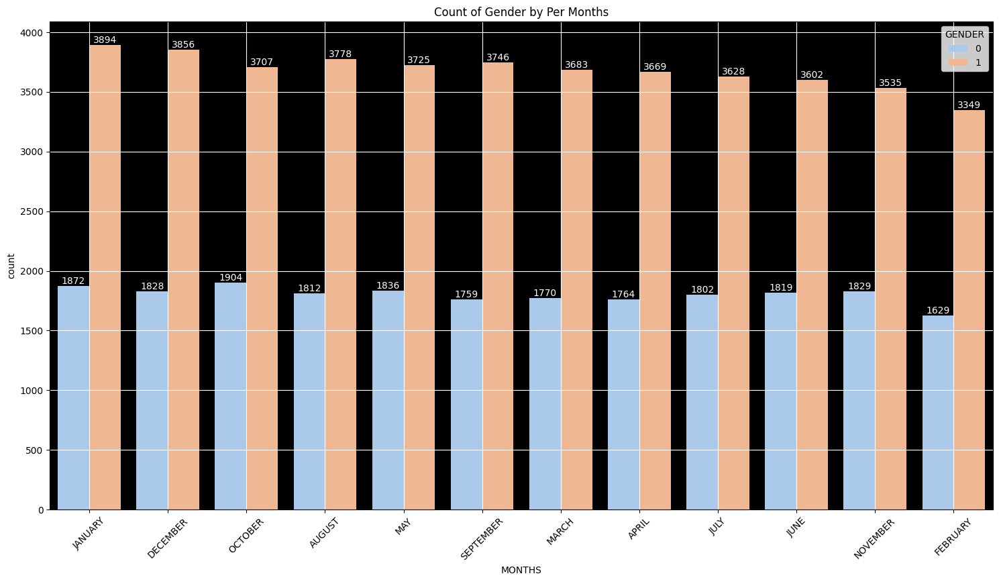

In [86]:
Graphs.Countplot_X(df, "MONTHS", hue = "GENDER", caption = "Count of Gender by Per Months")

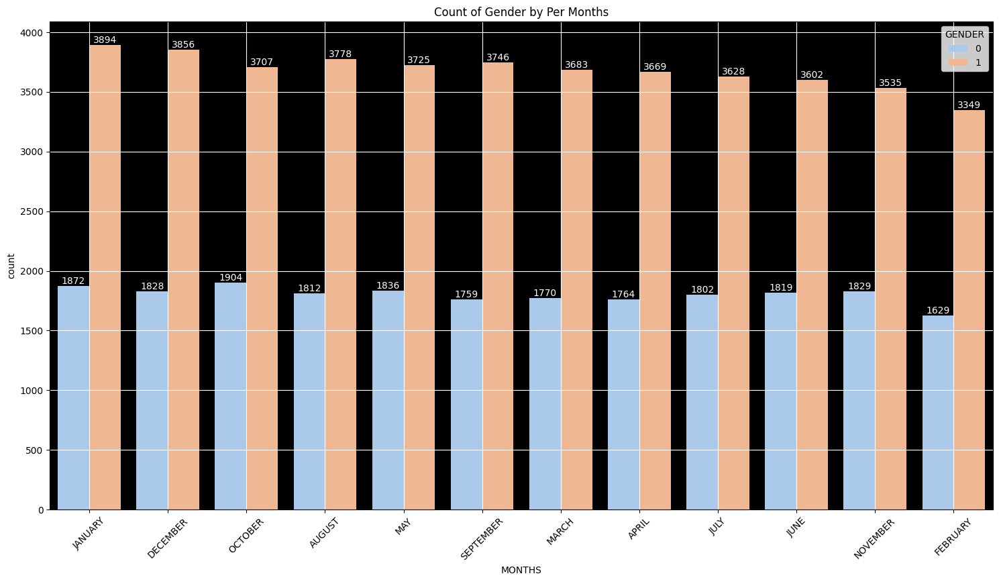

In [87]:
SeabornGraph = Graphs.Countplot_X(df, "MONTHS", hue = "GENDER", caption = "Count of Gender by Per Months")

In [88]:
SeabornGraph.get_figure().savefig('SeabornGraph2.jpg', bbox_inches='tight')  # Dash'e Seaborn grafiklerini paylaşmak için önce oluşturduğumuz grafiği Pc'mize kaydedip daha sonra bilgisayarımızdan dash'e
# Aktarmamız gerekiyor. Dash komutlarından devamını görebilirsiniz.

In [89]:
SeabornGraph

<Axes: title={'center': 'Count of Gender by Per Months'}, xlabel='MONTHS', ylabel='count'>

In [90]:
regressions = Regressions()
model, mse, r2, coef_data, coef_data_transposed = regressions.LinearRegression(df=df)

LINEAR MODEL MSE IS :  21.08454058050127
LINEAR MODEL r2 IS :  0.9061561087846779


In [91]:
r2

0.9061561087846779

In [92]:
mse

21.08454058050127

In [93]:
fig13 = Graphs.Create_Indicator_Plot_Without_Agg(val1 = r2, val2 = mse, text1 = "Model r2 is", text2 = "Model mse is")
fig13.show()

In [94]:
coef_data_transposed.shape

(23, 2)

# Dash Kodları

In [97]:
app = JupyterDash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP])
app.index_string = '''
<!DOCTYPE html>
<html>
    <head>
        {%metas%}
        <meta name="viewport" content="width=device-width, initial-scale=1.0">
        <title> SİMPLE EXAMPLE DATA DASH </title>
        {%favicon%}
        {%css%}
    </head>
    <body>
          <style>
    body {
        background-color: black;
     }
          </style>
        {%app_entry%}
        <footer>
            {%config%}
            {%scripts%}
            {%renderer%}
        </footer>
    </body>
</html>
'''
###########################################################################################################################################################################
###########################################################################################################################################################################
###########################################################################################################################################################################

app.layout = dbc.Container(fluid=True, children=[
    html.Img(src="/assets/data2.jpg", style={"width" : "1600px", "height" : "400px", "width" : "1600px", "margin-bottom" : "100px"}),
###########################################################################################################################################################################
    
    html.H1(children='[TR] Plotly Dash ile Veri Görselleştirme --  [EN] Data Visualization with Plotly Dash', 
            style = {"backgroundColor": "black", "color" : "white", "textAlign" : "center", "font-size": "32px", "width": "1600px", "height" : "100px"}),

###########################################################################################################################################################################

    html.H2(children='''[TR] VERİ GÖRSELLEŞTİRME PANELİME HOŞGELDİNİZ! -- [EN] WELCOME TO MY DATA VISUALIZATION DASHBOARD! ''',
             style={"backgroundColor": "black", 
                    "color": "white", 
                    "textAlign": "center", 
                    "font-weight": "bold", 
                    "font-size": "28px", 
                    "width" : "1600px", 
                    "height" : "100px"}),


    html.H3(children = ["Further information about Plotly Dash Please Click Here!  ", html.A("Link", href="https://rb.gy/60aoo", target="_blank")],
             style={"backgroundColor": "black",
                    "color" : "white",
                    "textAlign": "center",
                    "font-size": "32px",
                    "width": "1560px",
                    "height": "150px",
                    "display": "block",
                    "margin-top": "100px"}),
            

###########################################################################################################################################################################
    html.Div(children=dcc.Graph(id="graph13", figure=fig13), style={"display": "block", "padding": "50px", "margin-left": "auto", "margin-right": "auto"}),

    html.Div(
    dash_table.DataTable(
        id='table',
        columns=[{"name": i, "id": i} for i in coef_data_transposed.columns],
        data=coef_data_transposed.to_dict("records"),
        style_cell={'textAlign': 'left', "padding": "20px"},
        style_header={'backgroundColor': 'blue', 'fontWeight': 'bold', 'color': 'white', 'border': '1px solid white'},
        style_data = {'border': '1px solid white'},
        style_data_conditional = [{
                                'if': {'state': 'active'},
                                'backgroundColor': 'rgb(40, 40, 40)',
                                'border': '1px solid white'
                            }],
        style_table={'overflowX': 'scroll', "width": "1560px", "height": "400px"},
        fixed_rows={'headers': True},
    ),
    style={"margin-bottom": "50px"}
    ),

    ###########################################################################################################################################################################
    html.Div(children=[dcc.Graph(id="graph_new", figure=fig_new)], style={"display": "block", "padding": "50px"}),
    html.Div(children=[dcc.Graph(id="graph1", figure=fig1)], style={"display": "block", "padding": "50px"}),
    html.Div(children=[dcc.Graph(id="graph2", figure=fig2)], style={"display": "block", "padding": "50px", "margin-top" : "100px"}),
    html.Div(children=[dcc.Graph(id="graph3", figure=fig3)], style={"display": "block", "padding": "50px", "margin-top" : "100px"}),
    html.Div(children=[dcc.Graph(id="graph4", figure=fig4)], style={"display": "block", "padding": "50px", "margin-top" : "100px"}),
    html.Div(children=[dcc.Graph(id="graph5", figure=fig5)], style={"display": "block", "padding": "50px", "margin-top" : "100px"}),
    html.Div(children=[dcc.Graph(id="graph6", figure=fig6)], style={"display": "block", "padding": "50px", "margin-top" : "100px"}),
    html.Div(children=[dcc.Graph(id="graph7", figure=fig7)], style={"display": "block", "padding": "50px", "margin-top" : "100px"}),
    html.Div(children=[dcc.Graph(id="graph8", figure=fig8)], style={"display": "block", "padding": "50px", "margin-top" : "100px"}),
    html.Div(children=[dcc.Graph(id="graph9", figure=fig9)], style={"display": "block", "padding": "50px", "margin-top" : "100px"}),
    html.Div(children=[dcc.Graph(id="graph10", figure=fig10)], style={"display": "block", "padding": "50px", "margin-top" : "100px"}),
    html.Div(children=[dcc.Graph(id="graph11", figure=fig11)], style={"display": "block", "padding": "50px", "margin-top" : "100px"}),
    html.Div(children=[dcc.Graph(id="graph12", figure=fig12)], style={"display": "block", "padding": "50px", "margin-top" : "100px"}),
    html.Img(src="/assets/SeabornGraph.jpg", style={"height" : "800px", "width" : "1600px", "margin-bottom" : "100px"}), # Seaborn grafiğini eklediğimiz yer.
    html.H4(children='END OF THE DASH', style = {"backgroundColor": "black",
           "color": "white", 
           "textAlign" : "center", 
           "font-size": "32px", 
           "width": "1560px", 
           "height" : "100px",
           "display" : "block"}),
    ])

###########################################################################################################################################################################

for fig in [fig_new, fig1, fig2, fig3, fig4, fig5, fig6, fig7, fig8, fig9, fig10, fig11, fig12, fig13]:
        fig.update_layout({
        'height': 800,  # grafik yüksekliğini 800'e ayarla
        'width': 1500,  # grafik genişliğini 1500'e ayarla
    })

###########################################################################################################################################################################

# BURADA ARKA PLAN VE GRAFİKLERİ SİYAH YAPAN AYARLAR VAR
for child in app.layout.children:
    if not isinstance(child, html.Img) and not isinstance(child, (html.H1, html.H2, html.H3)):
        if hasattr(child, "style"):
            child.style.update({"backgroundColor": "black", "width": "1600"})
        else:
            child.style = {"backgroundColor": "black", "width": "1600"}

###########################################################################################################################################################################

if __name__ == '__main__':
    app.run_server(debug=True, host='192.168.1.38', port=8050) # Burada kendi IP adresinizi yazmayı unutmayın. Dash'i isterseniz bir sunucuya isterseniz bir AWS gibi web servislere bağlayabilirsiniz.
    # Bis şuan kendi Bilgisayarımızdan port açarak aynı ağda olan kişilere port açtık ve bu sayede herhangi bir tarayıcıdan  192.168.1.38 bu adresi giren kişiler oluşturduğumuz raporlara erişebilir.

Dash is running on http://192.168.1.38:8050/

Dash app running on http://192.168.1.38:8050/
